# Petty Theft experiment: base model

This notebooks contains the data processing, building and training part of the model used for the base iteration of the petty theft experiment. 

In [1]:
import shap
import random
import joblib
import witwidget
import numpy as np
import pandas as pd
import lightgbm as lgb
from keras import layers
from sklearn import preprocessing
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.metrics import classification_report,confusion_matrix
from witwidget.notebook.visualization import WitWidget, WitConfigBuilder

## Functions and Utils

In [2]:
def minmax_scaler(data):
  scaler = MinMaxScaler()
  scaled = scaler.fit_transform(data)
  return scaled

def process_data(data):
  x = data.loc[:, data.columns != 'Tipo salida 2']
  y = data['Tipo salida 2']

  x_cat = x[['region', 'barrister', 'crime_stage','foreigner']]
  x_cat['region'] = label_encoder.fit_transform(x_cat['region'])
  x_cat['barrister'] = label_encoder.fit_transform(x_cat['barrister'])
  x_cat['crime_stage'] = label_encoder.fit_transform(x_cat['crime_stage'])
  x_cat['foreigner'] = label_encoder.fit_transform(x_cat['foreigner'])

  x_num = x.loc[:, ~x.columns.isin(x_cat.columns)]

  x_norm = minmax_scaler(x_num)
  x_norm = pd.DataFrame(x_norm, columns = x_num.columns)

  x_norm.reset_index(drop=True, inplace=True)
  x_cat.reset_index(drop=True, inplace=True)

  x_fin = pd.concat([x_norm, x_cat], axis = 1)
  #y_fin = label_encoder.fit_transform(y)

  return x_fin

def custom_predict(examples_to_infer):

  preds = model.predict(model_inputs)
  preds = [[1 - pred[0], pred[0]] for pred in preds]
  return preds

## Importing data and pre-processing

In [ ]:
path = r'petty_theft_anon.csv'
data = pd.read_csv(path)

## Cambiando las dos RM a una sola

data['Región (tribunal)']=data['Región (tribunal)'].replace('Metropolitana Sur','Metropolitana')
data['Región (tribunal)']=data['Región (tribunal)'].replace('Metropolitana Norte','Metropolitana')

In [4]:
## Agregar variable edad

data['age_uniform'] = np.nan

## Rango de edades basado en los datos del CEAD
edad_min = 18
edad_max = 65

random.seed(23)

for i in range(len(data)):
    data['age_uniform'][i] = round(np.random.uniform(18, 65))

/var/folders/dv/yyl2yv_j3hl4xyrt3r2qmh4h0000gn/T/ipykernel_14992/3767326346.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['age_uniform'][i] = round(np.random.uniform(18, 65))
/var/folders/dv/yyl2yv_j3hl4xyrt3r2qmh4h0000gn/T/ipykernel_14992/3767326346.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['age_uniform'][i] = round(np.random.uniform(18, 65))
/var/folders/dv/yyl2yv_j3hl4xyrt3r2qmh4h0000gn/T/ipykernel_14992/3767326346.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39954 entries, 0 to 39953
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Región (tribunal)     39954 non-null  object 
 1   Tribunal              39954 non-null  object 
 2   Defensor              39954 non-null  object 
 3   Imputado              39954 non-null  object 
 4   CAUSAIMPUTADOID       39954 non-null  int64  
 5   RUD                   39954 non-null  object 
 6   Fecha término         39954 non-null  object 
 7   Audiencias efectivas  39954 non-null  int64  
 8   Delito                39954 non-null  object 
 9   Grado desarrollo      39954 non-null  object 
 10  Forma término SIGDP   39954 non-null  object 
 11  Forma término         39954 non-null  object 
 12  Multi FT              102 non-null    object 
 13  Tipo salida 1         39954 non-null  object 
 14  age_uniform           39954 non-null  float64
dtypes: float64(1), int6

In [6]:
data.drop(data.columns[[1, 3, 4, 5, 6, 8, 10, 11, 12]], axis=1, inplace=True)
data.rename(columns = {'Región (tribunal)':'region', 
                       'Grado desarrollo':'crime_stage',
                       'Defensor': 'barrister',
                       'Audiencias efectivas': 'effective_hearings'}, inplace = True)

## Data Transformations

In [7]:
x1 = data.loc[:, ~data.columns.isin(['Tipo salida 1'])]
y1 = data.loc[:, data.columns.isin(['Tipo salida 1'])]

In [8]:
x_train1, x_test1, y_train1, y_test1 = train_test_split(x1, y1['Tipo salida 1'], test_size=0.3, random_state = 23)

## Del set de entrenamiento, se desprenden 1000 datos para generar un dataset de validación

x_val1 = x_train1[-1000:]
y_val1 = y_train1[-1000:]

In [9]:
x_cat_train = x_train1[['region', 'barrister', 'crime_stage']]
x_cat_test = x_test1[['region', 'barrister', 'crime_stage']]
x_cat_val = x_val1[['region', 'barrister', 'crime_stage']]

In [10]:
label_encoder = preprocessing.LabelEncoder()

x_cat_train['barrister'] = label_encoder.fit_transform(x_cat_train['barrister'])
x_cat_train['crime_stage'] = label_encoder.fit_transform(x_cat_train['crime_stage'])
x_cat_train['region'] = label_encoder.fit_transform(x_cat_train['region'])

x_cat_test['barrister'] = label_encoder.fit_transform(x_cat_test['barrister'])
x_cat_test['crime_stage'] = label_encoder.fit_transform(x_cat_test['crime_stage'])
x_cat_test['region'] = label_encoder.fit_transform(x_cat_test['region'])

x_cat_val['barrister'] = label_encoder.fit_transform(x_cat_val['barrister'])
x_cat_val['crime_stage'] = label_encoder.fit_transform(x_cat_val['crime_stage'])
x_cat_val['region'] = label_encoder.fit_transform(x_cat_val['region'])

/var/folders/dv/yyl2yv_j3hl4xyrt3r2qmh4h0000gn/T/ipykernel_14992/2235648610.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_cat_train['barrister'] = label_encoder.fit_transform(x_cat_train['barrister'])
/var/folders/dv/yyl2yv_j3hl4xyrt3r2qmh4h0000gn/T/ipykernel_14992/2235648610.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_cat_train['crime_stage'] = label_encoder.fit_transform(x_cat_train['crime_stage'])
/var/folders/dv/yyl2yv_j3hl4xyrt3r2qmh4h0000gn/T/ipykernel_14992/2235648610.py:5: SettingW

In [11]:
x_num_train = x_train1.loc[:, ~x_train1.columns.isin(x_cat_train.columns)]
x_num_test = x_test1.loc[:, ~x_test1.columns.isin(x_cat_test.columns)]
x_num_val = x_val1.loc[:, ~x_val1.columns.isin(x_cat_val.columns)]

In [12]:
x_norm_train = minmax_scaler(x_num_train)
x_norm_train = pd.DataFrame(x_norm_train, columns = x_num_train.columns)

x_norm_test = minmax_scaler(x_num_test)
x_norm_test = pd.DataFrame(x_norm_test, columns = x_num_test.columns)

x_norm_val = minmax_scaler(x_num_val)
x_norm_val = pd.DataFrame(x_norm_val, columns = x_num_val.columns)

In [13]:
for x in range(len(label_encoder.classes_)):
  print(x, label_encoder.classes_[x])

0 Antofagasta
1 Arica y Parinacota
2 Atacama
3 Aysén
4 Bio Bío
5 Coquimbo
6 La Araucanía
7 Libertador Bernardo O'Higgins
8 Los Lagos
9 Los Ríos
10 Magallanes y Antártica Chilena
11 Maule
12 Metropolitana
13 Tarapacá
14 Valparaíso
15 Ñuble


In [14]:
x_cat_train['region_alt'] = x_cat_train['region'].apply(lambda x: 1 if x in {14, 12, 11, 8, 7, 6, 5, 4} else 0)
x_cat_test['region_alt'] = x_cat_test['region'].apply(lambda x: 1 if x in {14, 12, 11, 8, 7, 6, 5, 4} else 0)
x_cat_val['region_alt'] = x_cat_val['region'].apply(lambda x: 1 if x in {14, 12, 11, 8, 7, 6, 5, 4} else 0)

/var/folders/dv/yyl2yv_j3hl4xyrt3r2qmh4h0000gn/T/ipykernel_14992/1526708176.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_cat_train['region_alt'] = x_cat_train['region'].apply(lambda x: 1 if x in {14, 12, 11, 8, 7, 6, 5, 4} else 0)
/var/folders/dv/yyl2yv_j3hl4xyrt3r2qmh4h0000gn/T/ipykernel_14992/1526708176.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_cat_test['region_alt'] = x_cat_test['region'].apply(lambda x: 1 if x in {14, 12, 11, 8, 7, 6, 5, 4} else 0)
/var/folders/dv/yyl2yv_j3hl4xyrt3r

In [15]:
x_norm_train.reset_index(drop=True, inplace=True)
x_cat_train.reset_index(drop=True, inplace=True)

x_norm_test.reset_index(drop=True, inplace=True)
x_cat_test.reset_index(drop=True, inplace=True)

x_norm_val.reset_index(drop=True, inplace=True)
x_cat_val.reset_index(drop=True, inplace=True)

In [16]:
x_train_fin = pd.concat([x_norm_train, x_cat_train], axis = 1)
x_test_fin = pd.concat([x_norm_test, x_cat_test], axis = 1)
x_val_fin = pd.concat([x_norm_val, x_cat_val], axis = 1)

In [17]:
y_train_fin = label_encoder.fit_transform(y_train1)
y_test_fin = label_encoder.fit_transform(y_test1)
y_val_fin = label_encoder.fit_transform(y_val1)

In [18]:
class_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print(class_mapping)

{'No favorable': 0, 'Salida favorable': 1}


## Building the model

In [19]:
print('Training Features Shape:', x_train_fin.shape)
print('Training Labels Shape:', y_train_fin.shape)

print('Testing Features Shape:', x_test_fin.shape)
print('Testing Labels Shape:', y_test_fin.shape)

Training Features Shape: (27967, 6)
Training Labels Shape: (27967,)
Testing Features Shape: (11987, 6)
Testing Labels Shape: (11987,)


In [20]:
train_data = lgb.Dataset(x_train_fin, label=y_train_fin)
val_data = lgb.Dataset(x_val_fin, label=y_val_fin)
test_data = lgb.Dataset(x_test_fin, label=y_test_fin)

In [21]:
## Parámetros

boosting_type = 'gbdt'
num_leaves = 63
max_depth = -1
learning_rate = 0.01
n_estimators = 100
objective = 'binary'
#class_weight

In [22]:
## Diccionario de parámetros

model = lgb.LGBMClassifier(
    boosting_type = boosting_type,
    num_leaves = num_leaves,
    max_depth = max_depth,
    learning_rate = learning_rate,
    n_estimators = n_estimators,
    objective = objective
)

In [23]:
model.fit(x_train_fin, y_train_fin)

[LightGBM] [Info] Number of positive: 7859, number of negative: 20108
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000383 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 341
[LightGBM] [Info] Number of data points in the train set: 27967, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.281010 -> initscore=-0.939458
[LightGBM] [Info] Start training from score -0.939458


LGBMClassifier(learning_rate=0.01, num_leaves=63, objective='binary')

## Model Evaluation

In [24]:
## Generando predicciones

predict_train1 = (model.predict_proba(x_train_fin)[:, 1] > 0.5).astype(int)
predict_test1 = (model.predict_proba(x_test_fin)[:, 1] > 0.5).astype(int)

In [25]:
## Matriz de confusión para dataset de entrenamiento

print(confusion_matrix(y_train_fin,predict_train1))
print(classification_report(y_train_fin,predict_train1))

[[19332   776]
 [ 5226  2633]]
              precision    recall  f1-score   support

           0       0.79      0.96      0.87     20108
           1       0.77      0.34      0.47      7859

    accuracy                           0.79     27967
   macro avg       0.78      0.65      0.67     27967
weighted avg       0.78      0.79      0.75     27967



In [26]:
## Matriz de confusión para dataset de prueba

print(confusion_matrix(y_test_fin,predict_test1))
print(classification_report(y_test_fin,predict_test1))

[[8263  448]
 [2343  933]]
              precision    recall  f1-score   support

           0       0.78      0.95      0.86      8711
           1       0.68      0.28      0.40      3276

    accuracy                           0.77     11987
   macro avg       0.73      0.62      0.63     11987
weighted avg       0.75      0.77      0.73     11987



## Saving results and model

In [27]:
test_results = pd.DataFrame(predict_test1, columns=['score'])

x_test1_alt = x_test1.reset_index(drop=True)
y_test1_alt = y_test1.reset_index(drop=True)

test = pd.concat([x_test1_alt, test_results, pd.DataFrame(y_test_fin)], axis = 1)

path2 = r'outputs/preds_pt_base_uniform.csv'
test.to_csv(path2)

In [28]:
joblib.dump(model, 'outputs/pt_base_uniform.pkl')

['outputs/pt_base_uniform.pkl']

## SHAP Values

In [29]:
explainer = shap.Explainer(model, x_train_fin.values[:])
shap_values = explainer(x_train_fin.values[:])
shap_values

 99%|===================| 27660/27967 [01:06<00:00]        

.values =
array([[-2.34047943e-01,  5.35955562e-03,  2.51944001e-01,
         3.38960562e-02, -3.02764572e-01,  1.58927095e-05],
       [ 1.19675978e+00, -1.42267157e-03,  1.40496515e-01,
         4.48114533e-02, -9.27269828e-02,  1.58927095e-05],
       [ 5.58843916e-01,  7.85337816e-03, -1.70141145e-01,
        -2.46621803e-02, -6.25213009e-02,  2.43446557e-04],
       ...,
       [ 2.68339525e-01,  2.43336914e-02, -2.90542813e-02,
         7.11503179e-02,  1.23207882e-01,  1.37037990e-03],
       [ 1.91124126e-01, -1.19785082e-01,  8.54934864e-02,
        -1.05614291e-01,  8.54650649e-02,  1.97749615e-04],
       [-2.56960457e-01,  2.03214522e-03,  6.16372682e-02,
        -3.39874138e-02, -1.84484958e-01,  1.58927095e-05]])

.base_values =
array([-1.00664698, -1.00664698, -1.00664698, ..., -1.00664698,
       -1.00664698, -1.00664698])

.data =
array([[3.57142857e-02, 9.14893617e-01, 4.00000000e+00, 3.06000000e+02,
        1.00000000e+00, 1.00000000e+00],
       [0.00000000e+00, 6.3

In [30]:
shap_values.feature_names = list(x_train_fin.columns)

In [31]:
shap_df = pd.DataFrame(shap_values.values, columns=shap_values.feature_names)

# Calcular el valor absoluto y luego el promedio para cada característica
shap_abs_avg = shap_df.abs().mean()
shap_avg = shap_df.mean()
shap_max = shap_df.max()
shap_min= shap_df.min()
shap_median = shap_df.median()

print('Media absoluta: ', '\n\n', shap_abs_avg)
print('----------------------------------')
print('Media: ', '\n\n', shap_avg)
print('----------------------------------')
print('Máximo: ', '\n\n', shap_max)
print('----------------------------------')
print('Mínimo: ', '\n\n', shap_min)
print('----------------------------------')
print('Mediana: ', '\n\n', shap_median)

Media absoluta:  

 effective_hearings    0.379225
age_uniform           0.005024
region                0.185918
barrister             0.059781
crime_stage           0.167150
region_alt            0.001180
dtype: float64
----------------------------------
Media:  

 effective_hearings   -0.026311
age_uniform           0.000838
region                0.023420
barrister            -0.018388
crime_stage           0.011579
region_alt           -0.000354
dtype: float64
----------------------------------
Máximo:  

 effective_hearings    1.436418
age_uniform           0.077973
region                1.147199
barrister             0.452067
crime_stage           1.537867
region_alt            0.015235
dtype: float64
----------------------------------
Mínimo:  

 effective_hearings   -0.455198
age_uniform          -0.120348
region               -0.602309
barrister            -0.593138
crime_stage          -0.402781
region_alt           -0.068664
dtype: float64
----------------------------------
M

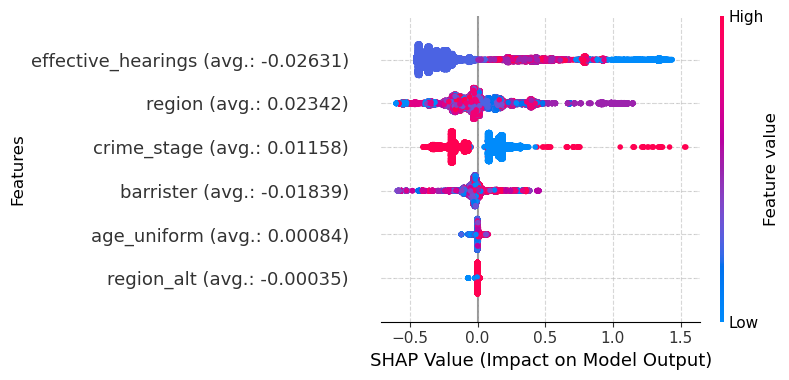

<Figure size 640x480 with 0 Axes>

In [32]:
# Convertir los SHAP values a un DataFrame
shap_df = pd.DataFrame(shap_values.values, columns=shap_values.feature_names)

# Calcular el promedio absoluto de los valores SHAP para cada característica
shap_abs_avg = shap_df.mean()

# Crear un nuevo arreglo para incluir los nombres de las características con sus valores promedio absolutos
feature_names_with_shap_means = [
    f"{name} (avg.: {avg:.5f})" for name, avg in zip(shap_values.feature_names, shap_abs_avg)
]

# Actualizar los nombres de las características en shap_values
shap_values.feature_names = feature_names_with_shap_means
plt.close('all')

# Crear el gráfico beeswarm
fig, ax = plt.subplots(figsize=(10, 8))  # Tamaño del gráfico
shap.plots.beeswarm(shap_values, show=False)

# for i, (name, max_val, min_val) in enumerate(zip(feature_names_with_shap_means, shap_max, shap_min)):
#     ax.text(max_val, i, f"Max: {max_val:.2f}", fontsize=8, color='red', va='center', ha='left')
#     ax.text(min_val, i, f"Min: {min_val:.2f}", fontsize=8, color='blue', va='center', ha='right')

# Personalizar el gráfico
ax.set_xlabel("SHAP Value (Impact on Model Output)")
ax.set_ylabel("Features", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.5)

# Mostrar el gráfico
plt.tight_layout()
plt.show()
plt.clf()

In [33]:
fig.savefig("outputs/pt_base_uniform_shap.pdf", bbox_inches="tight", format="pdf")  # o "shap_plot.svg" para formato SVG

## What if Tool

In [34]:
num_datapoints = y_test_fin.shape[0]
tool_height_in_px = 750

examples_labels = pd.concat([x_test_fin.reset_index(drop=True), pd.DataFrame(y_test_fin, columns = ['Tipo salida 1']).reset_index(drop=True)], axis=1)
columns_not_for_model_input = [examples_labels.columns.get_loc('Tipo salida 1')]

examples_wit = examples_labels.values.tolist()
column_names = examples_labels.columns.tolist()

model_inputs = np.delete(np.array(examples_wit[:num_datapoints]), columns_not_for_model_input, axis=1)

def custom_predict_shap(examples_to_infer):

  preds = model.predict_proba(model_inputs)
  preds = [[pred[0], pred[1]] for pred in preds]

  shap_output = explainer(model_inputs)
  attributions = []
  for single_shap_output in shap_output:  # iteramos sobre cada resultado de shap (cada ejemplo)
    attrs = {}
    for i, col in enumerate(x_train_fin.columns):
      attrs[col] = single_shap_output.values[i]  # utilizamos single_shap_output.values
    attributions.append(attrs)

  ret = {'predictions': preds, 'attributions': attributions}

  return ret

In [35]:
# Setup the tool with the test examples and the trained classifier

config_builder = WitConfigBuilder(examples_wit[:num_datapoints],column_names).set_custom_predict_fn(custom_predict_shap).set_target_feature('Tipo salida 1')
WitWidget(config_builder, height=tool_height_in_px)

WitWidget(config={'model_type': 'classification', 'label_vocab': [], 'feature_names': ['effective_hearings', '…